    - Split a LST into districts
    - get average lst for each district
    - get area in different bands for each district.
    - get temperature on streets

In [1]:
import os
from glob import glob
import pandas as pd
import geopandas as gpd
import numpy as np
import xarray as xr
from PIL import Image
import rioxarray as rxr
import rasterio as rio
from rasterio.windows import Window
from rasterio.warp import calculate_default_transform, reproject, Resampling
from io import BytesIO
import base64
from shapely.geometry import Polygon, LineString
import matplotlib.pyplot as plt
import plotly.express as px
import folium
import branca

Load districts

<Axes: >

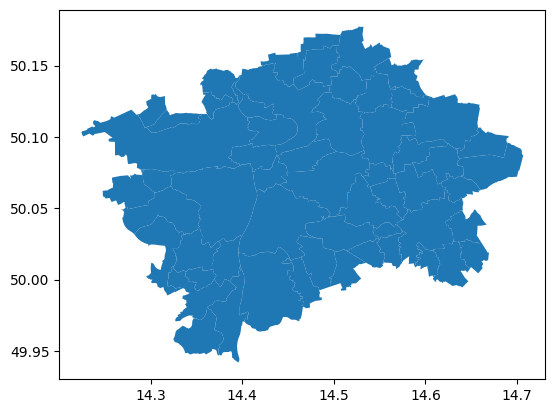

In [2]:
districts = gpd.read_feather("../data/raw/prague_districts.feather")
districts.plot()

load lst

In [5]:
data_path = "../data/"
scene = [f for f in os.listdir("../data/raw/") if f.startswith("Prague")][0]

if not os.path.exists(os.path.join(data_path, "processed", scene)):
    os.mkdir(os.path.join(data_path, "processed", scene))
    
files = os.listdir(os.path.join(data_path, "raw", scene)) 
lst_files = [os.path.join(data_path, "raw", scene, f) for f in files if "LST" in f]
lst_files

['../data/raw/Prague_LC08_L1TP_192025_20180817_20200831_02_T1/LC08_L1TP_192025_20180817_20200831_02_T1_LST_Prague.TIF']

reprojecting from EPSG:32633 to EPSG:4326


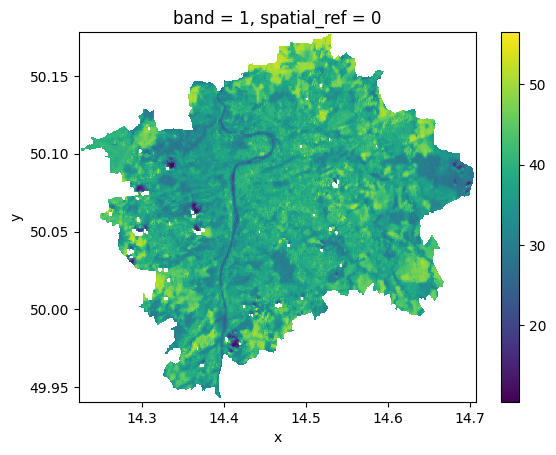

In [6]:
def reproject_tif(src_file:str, dst_file:str, dst_crs:str="" ): 
        """Reproject a saved .TIF file to a desired crs

        Args:
            src_file (str): source file path
            dst_file (str): destination file path
            dst_crs (str): destination crs
        """
        if dst_crs == "":
            dst_crs = "EPSG:4326"

        with rio.open(src_file) as src:
            transform, width, height = calculate_default_transform(
                src.crs, dst_crs, src.width, src.height, *src.bounds)
            print(f"reprojecting from {src.crs} to {dst_crs}")
            kwargs = src.meta.copy()
            kwargs.update({
                'crs': dst_crs,
                'transform': transform,
                'width': width,
                'height': height
            })

            nodata = src.nodata
            with rio.open(dst_file, 'w', **kwargs) as dst:
                for i in range(1, src.count + 1):
                    reproject(
                        source=rio.band(src, i),
                        destination=rio.band(dst, i),
                        src_transform=src.transform,
                        src_crs=src.crs,
                        dst_transform=transform,
                        dst_crs=dst_crs,
                        resampling=Resampling.cubic,
                        src_nodata=nodata,
                        sdst_nodata=nodata)
            
            # Get rid of edge artifacts - might cause issues if visualizing cold temperatures
            with rio.open(dst_file, 'r+') as dst:
                for i in range(1, dst.count + 1):
                    data = dst.read(i)
                    mask = data == 0
                    data[mask] = dst.nodata  # Set them to the official no-data value
                    dst.write(data, i)
        
        return dst_file

reprojected = reproject_tif(src_file=lst_files[0], 
                            dst_file=lst_files[0].replace("LST", "LST_reprojected").replace("raw", "processed"))
xds = rxr.open_rasterio(reprojected, masked=True)
xds.plot()

# Add to Folium

In [23]:
def array_to_colored_png(data, cmap='jet', vmin=None, vmax=None, transparent=np.nan):
        if vmin is None:
            vmin = np.nanmin(data)
        if vmax is None:
            vmax = np.nanmax(data)

        # Normalize the data and apply the colormap
        norm = plt.Normalize(vmin=vmin, vmax=vmax)
        mapper = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
        colored_data = mapper.to_rgba(data, bytes=True)  # Get RGBA data from the colormap

        # Set transparency for NaNs or data below a threshold
        if transparent is not None:
            alpha_channel = np.isnan(data) if np.isnan(transparent) else (data <= transparent)
            colored_data[..., 3] = np.where(alpha_channel, 0, 255)  # Update alpha channel: 0 is transparent, 255 is opaque

        # Convert array to an image
        img = Image.fromarray(colored_data)
        img_byte_arr = BytesIO()
        img.save(img_byte_arr, format='PNG')
        img_byte_arr = img_byte_arr.getvalue()
        
        # Convert to base64 and create data URL
        base64_encoded = base64.b64encode(img_byte_arr)
        base64_data_url = f"data:image/png;base64,{base64_encoded.decode()}"

        return base64_data_url

def generate_colorbar(cmap:str='jet', vmin:float=0, vmax:float=100, data:np.array=None):
    if data is not None:
        vmin = np.nanmin(data)
        vmax = np.nanmax(data)
        
    # Create a colorbar as a legend
    step = (vmax - vmin) / 5
    grades = list(range(int(vmin), int(vmax) + int(step), int(step)))
    colors = [plt.cm.get_cmap(cmap)((v-vmin)/(vmax-vmin)) for v in grades]

    # Create a colormap
    colormap = branca.colormap.LinearColormap(
        colors=colors,
        vmin=vmin,
        vmax=vmax,
        index=grades,
        caption='Land Surface Temperature'  # Change this caption to your data description
    )
    return colormap

/tmp/ipykernel_53782/3966207945.py:37: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = [plt.cm.get_cmap(cmap)((v-vmin)/(vmax-vmin)) for v in grades]



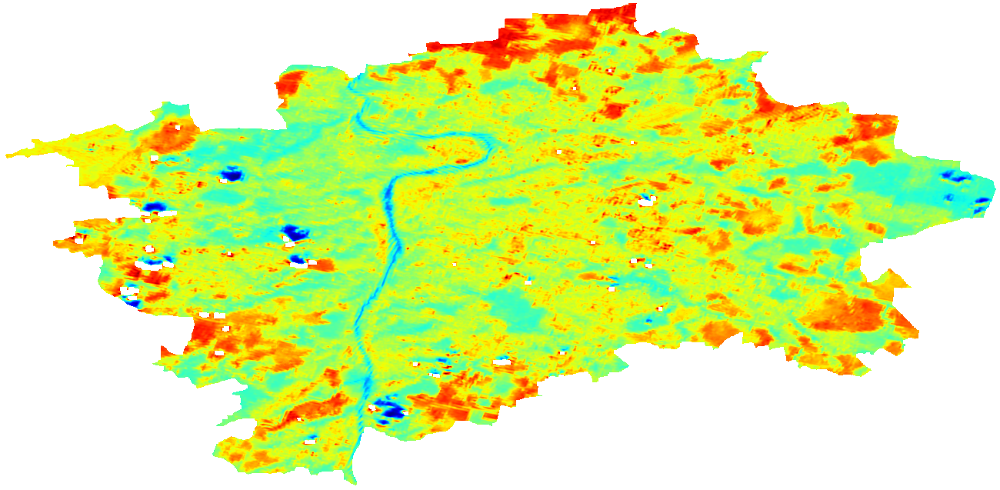

In [32]:
with rio.open(reprojected) as src:
    image_bounds = src.bounds
    crs = src.crs
    data = src.read(1)
    
img_bytes = array_to_colored_png(data)
left, bottom, right, top = image_bounds

m = folium.Map()

# Create an image overlay
img_overlay = folium.raster_layers.ImageOverlay(
    img_bytes,
    bounds=[[bottom, left], [top, right]],
    opacity=0.6,
    interactive=True,
    cross_origin=False,
    zindex=1,
)
img_overlay.add_to(m)

# Create Colorbar
colorbar = generate_colorbar(data=data)
colorbar.add_to(m)

# Zoom to bounds
m.fit_bounds(m.get_bounds())
folium.LayerControl().add_to(m)

m

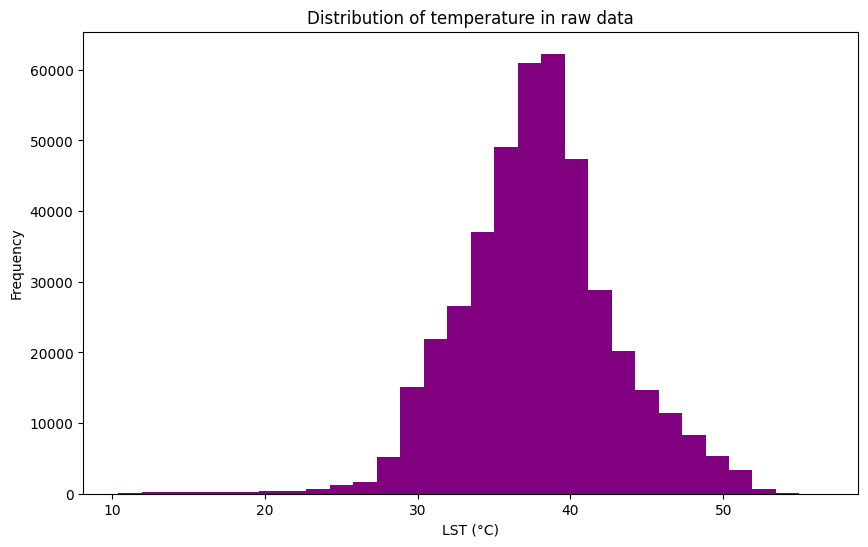

In [6]:
# Plot a histogram
f, ax = plt.subplots(figsize=(10, 6))
xds.plot.hist(ax=ax,
              color="purple",
              bins=30)
ax.set(title="Distribution of temperature in raw data",
       xlabel='LST (°C)',
       ylabel='Frequency')
plt.show()

Can we do the above, but for each district?

In [7]:
def compute_lst_stats_per_district(district_gdf, lst_clipped, ranges_dict:dict):
    """_summary_

    Args:
        district_gdf (GeoDataFrame): _description_
        lst_clipped (Tiff): _description_
        ranges_dict (dict): _description_

    Returns:
        pd.DataFrame: _description_
    """
    results = pd.DataFrame()
    for i, district in district_gdf.iterrows():
        # Clip the TIFF data using the district's geometry
        clipped = lst_clipped.rio.clip([district.geometry], district_gdf.crs, drop=True).squeeze()
        
        # Convert the clipped xarray Dataset to a DataFrame
        clipped_df = clipped.to_dataframe(name='lst').dropna().reset_index()
        # Add district information to the results

        # Initialize a dictionary to store area for each range
        # Calculate statistics (mean, count, area) for each band
        stats = clipped_df.groupby('band').agg(
            lst_min=('lst', 'min'),
            lst_mean=('lst', 'mean'),
            lst_max=('lst', 'max'),
            pixel_count=('lst', 'size'),
            total_area=('lst', lambda x: x.size * np.abs(clipped.rio.resolution()[0]) * np.abs(clipped.rio.resolution()[1]))  # Area assuming pixel resolution is in meters
        ).reset_index()

        stats['district_id'] = district['id']  # Assuming your districts GeoDataFrame has an 'id' column
        district_area = clipped_df.shape[0]

        # Calculate the area for each defined range
        for range_key, (min_val, max_val) in ranges_dict.items():
            # Filter the DataFrame for the current range
            mask = (clipped_df['lst'] >= min_val) & (clipped_df['lst'] < max_val)
            filtered_df = clipped_df[mask].dropna()

            # Calculate the area (assuming the pixel size is in meters)
            filtered_area = filtered_df.shape[0]

            # Store the result in the dictionary
            stats[f"{min_val} <= lst < {max_val}"] = filtered_area / district_area   
        if len(results)== 0:
            results = stats
        else:
            results = pd.concat([results, stats])
    
    return results


In [8]:
ranges_dict = {"1": (-20, 27), "2": (27, 32), "3": (32, 40), "4": (40,100)}
results = compute_lst_stats_per_district(districts, xds, ranges_dict)

In [9]:
districts_stats_gpd = pd.merge(districts, results, how="inner", left_on="id", right_on="district_id")

In [10]:
districts_stats_gpd.head()

,geometry,id,name,slug,updated_at,band,lst_min,lst_mean,lst_max,pixel_count,total_area,district_id,-20 <= lst < 27,27 <= lst < 32,32 <= lst < 40,40 <= lst < 100
0,"POLYGON ((14.31810 49.98889, 14.31799 49.98921...",1,Praha-Řeporyje,praha-reporyje,None,1,12.915318,39.555580,51.781441,7043,0.000978,1,0.011075,0.079512,0.486866,0.422547
1,"POLYGON ((14.41089 50.07867, 14.40982 50.07907...",2,Praha 1,praha-1,None,1,20.221773,35.889774,46.789577,5016,0.000697,2,0.070375,0.119617,0.620614,0.189394
2,"POLYGON ((14.32370 50.07615, 14.32244 50.07621...",3,Praha 6,praha-6,None,1,10.430362,35.536552,54.579266,35513,0.004932,3,0.021288,0.182215,0.624813,0.171684
3,"POLYGON ((14.47849 50.09771, 14.47925 50.09813...",4,Praha 9,praha-9,None,1,28.868288,38.454269,54.576115,11923,0.001656,4,0.000000,0.038245,0.649836,0.311918
4,"POLYGON ((14.45301 50.00255, 14.45307 50.00246...",10,Praha 12,praha-12,None,1,10.901072,37.427696,56.522404,19769,0.002745,10,0.048106,0.122161,0.519601,0.310132


In [11]:
bounds = districts_stats_gpd.total_bounds
center = {"lon": 0.5 * (bounds[0] + bounds[2]),
          "lat": 0.5 * (bounds[1] + bounds[3])}

px.choropleth_mapbox(districts_stats_gpd,
                     geojson=districts_stats_gpd.geometry,
                     locations=districts_stats_gpd.index,
                     color="lst_max",
                     opacity=0.5,
                     zoom=9,
                     center=center,
                     mapbox_style="carto-positron",)

In [12]:
prague_lst_df = districts_stats_gpd.drop(["geometry", "id", "district_id", "slug", "pixel_count", "updated_at", "band"], axis=1)
prague_lst_df.set_index("name", inplace=True)
prague_lst_df.sort_values(by="lst_mean", inplace=True)
prague_lst_df.head()

,lst_min,lst_mean,lst_max,total_area,-20 <= lst < 27,27 <= lst < 32,32 <= lst < 40,40 <= lst < 100
name,,,,,,,,
Praha-Klánovice,16.441814,31.197508,44.347755,0.000692,0.048746,0.575125,0.372718,0.003410
Praha 21,13.731873,31.772797,42.304420,0.001161,0.055609,0.470222,0.470103,0.004066
Praha-Troja,24.429724,34.233269,43.645657,0.000424,0.031434,0.183694,0.755403,0.029470
Praha-Lysolaje,28.906469,34.987503,47.431351,0.000275,0.000000,0.162203,0.784740,0.053057
Praha 5,11.956290,35.067520,55.189880,0.003372,0.037312,0.163907,0.693724,0.105057


In [13]:
px.scatter(prague_lst_df.iloc[:, :3], template="plotly_white")

In [14]:
px.box(prague_lst_df.iloc[:, :3], template="plotly_white")

In [15]:
px.bar(prague_lst_df.iloc[:, 4:], 
       barmode="stack", 
       orientation="h", 
       template="plotly_white",
       height=800)

In [24]:
districts_stats_gpd.to_file("../data/processed/Prague_districts_lst.json")
districts_stats_gpd.to_feather("../data/processed/Prague_districts_lst.feather")
                     